# Libraries

In [126]:
# using Pkg
# Pkg.add("BenchmarkTools")
# Pkg.add("LaTeXStrings")
# Pkg.add("SpecialFunctions")

In [1]:
using DifferentialEquations
using BenchmarkTools
using Plots
using LaTeXStrings
using SpecialFunctions
using Printf

# Collective Effects - Uniform, Monoenergetic and Isotropic Neutrino Gas

### Constants

In [2]:
G_F=1.1663787*10^(-23) #eV⁻² - Fermi Constant
delta_m2_31=2.5*10^(-3) #eV² - \Delta m²_31
delta_m2_21=7.53*10^(-5); #eV²
theta_31=asin(sqrt(2.18*10^-2)) #\theta_31
theta_21=asin(sqrt(0.307));
N_A=6.02*10^(23) #Avogadro constant

h_slash=6.582119569*10^-16# eV⋅s
c_const=2.99792458*10^8# m/s
from_eV_to_1_over_m=1/(h_slash*c_const)
from_eV_to_1_over_km=from_eV_to_1_over_m*10^(3)
from_1_over_cm3_to_eV3=(1.973*10^(-5))^3
erg_to_MeV=6.2415*10^5;

### Auxiliar Functions

In [3]:
# L vector
function L_vec(n_dim)
    if n_dim==3
        return [0,0,1]
    else
        println("Dimension not defined")
    end
end    

# B vector
function B_vec(n_dim,theta)
    if n_dim==3
        B1=-1*sin(2*theta)
        B2=0
        B3=cos(2*theta)
        return [B1,B2,B3]
    else
        println("Dimension not defined")
    end
end;

function mu_supernova(r,mu_opt,mu_0=0) # r in km
    if mu_opt=="SN"
        R_0=40#km
        if r<R_0
            return mu_0
        end
        return mu_0*(R_0/r)^4 #eV
    
    elseif mu_opt=="const"
        return mu_0
    
    else
        println("Not a mu option!")
        return 0
    end
end;


#Electron density profile
function lambda_supernova(r,option,ne=N_A,t=1) # r in km
  Y_e=0.5
  m_n=1.67492749804*10^-24 #g
  ne_aux=0
  if option=="no"
      ne_aux=0
  elseif option=="const"
      ne_aux=ne
#   elseif option=="SN"
#       ne_aux=(Y_e/m_n)*SN_density_profile(r,t)
  else
    println("Not a matter option")
    return 0
  end
    
  return sqrt(2)*G_F*from_1_over_cm3_to_eV3*ne_aux #eV
end;

function structure_constant(n_dim,i,j,k)
    if i==j || i==k || j==k
        return 0
    end
    
    if n_dim==3
        i_next=i%3+1
        if  i_next == j
            return 1
        end
        if i_next == k
            return -1 
        end
    else
        println("Dimension not defined")
    end
end;
                
function cross_prod(A,B)
    n_components=length(A)
    C=[]
    for i in 1:n_components
      sum=0
      for j in 1:n_components
          for k in 1:n_components
            sum=sum+structure_constant(n_components,i,j,k)*A[j]*B[k]
          end
      end
    push!(C,sum)
    end
    return C
end;

function phi(E,E_0,alpha)
  N=((alpha+1)^(alpha+1))/(E_0*gamma(alpha+1))
  R=N*((E/E_0)^alpha)*exp((-1)*(alpha+1)*E/E_0)
  return R
end;

### ODE Function

In [302]:
function func_Isotropic_Monoenergetic!(dy,y, params, time)
    omega,mu_opt,mu_0,lamb_opt,lamb_0,n_dim= params  # unpack parameters
    
    B=B_vec(n_dim,theta_31)
    L=L_vec(n_dim)
    
    r=time/from_eV_to_1_over_km #From eV⁻¹ to km
    mu=mu_supernova(r,mu_opt,mu_0)
    lamb=lambda_supernova(r,lamb_opt,lamb_0) 
    
    #nu
    P_aux= cross_prod(y[1:n_dim],(B*omega+L*lamb+mu*y[n_dim+1:end]))
    for k in 1:n_dim
        dy[k]=P_aux[k]
    end 
    #nu_bar 
    P_aux= cross_prod(y[n_dim+1:end],(-1*B*omega+L*lamb-mu*y[1:n_dim]))
    for k in 1:n_dim
        dy[k+3]=P_aux[k]
    end 
end;

In [303]:
function solver_Isotropic_Monoenergetic(P,E,r_i,r_f,mass_ord,mu_opt,mu_0;lamb_opt="no",lamb_0=0,n_f=2,reltol=1e-8,abstol=1e-8)

    omega=delta_m2_31/(2*E*10^6) #eV
    r_step = (2*pi/max(omega,mu_0))/200 #eV⁻¹
    r_i = r_i*from_eV_to_1_over_km
    r_f = r_f*from_eV_to_1_over_km
    r = range(r_i,r_f,step=r_step) #eV⁻¹
    n_dim=(n_f^2)-1
    
    if mass_ord=="NH"
        params=omega,mu_opt,mu_0,lamb_opt,lamb_0,n_dim
    elseif mass_ord=="IH"
        omega=-1*omega
        params=omega,mu_opt,mu_0,lamb_opt,lamb_0,n_dim
    else
        println("Not a mass ordering option!")
        return 0
    end

    prob = ODEProblem(func_Isotropic_Monoenergetic!,P,(r_i,r_f),params,reltol=reltol,abstol=abstol)
    sol = solve(prob);  
    
    return sol
            
end;

## Solutions

## 1.1. Symmetric and $\mu=$ const

In [304]:
P=[0,0,1,0,0,1]
E=20 #MeV
r_i,r_f=0,10 #km
omega=delta_m2_31/(2*E*10^6)
omega_max=delta_m2_31/(2*10^6)
mu_opt,mu_0 ="const", 10*omega_max

sol_IH= @btime solver_Isotropic_Monoenergetic(P,E,r_i,r_f,"IH",mu_opt,mu_0)
sol_NH= @btime solver_Isotropic_Monoenergetic(P,E,r_i,r_f,"NH",mu_opt,mu_0);

  6.725 ms (132960 allocations: 6.42 MiB)
  3.839 ms (75875 allocations: 3.68 MiB)


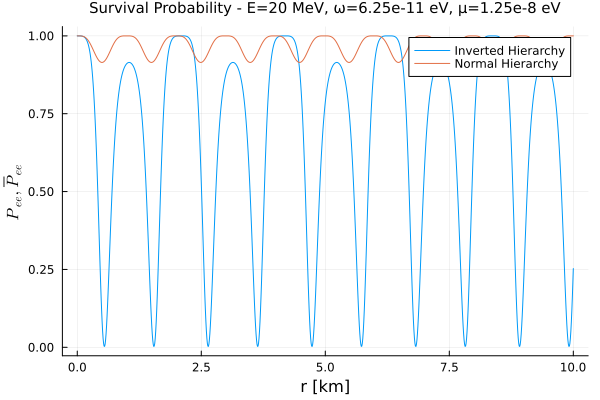

In [305]:
r=LinRange(r_i,r_f,1000)
P_IH=sol_IH(r*from_eV_to_1_over_km)
P_NH=sol_NH(r*from_eV_to_1_over_km)

plot(r,1/2*(1 .+P_IH[3,:]/P_IH[1][3]),label="Inverted Hierarchy")
plot!(r,1/2*(1 .+P_NH[3,:]/P_NH[1][3]),label="Normal Hierarchy")
title!("Survival Probability - E=$E MeV, ω=$omega eV, μ=$mu_0 eV",titlefontsize=10) 
xlabel!("r [km]")
ylabel!(L"P_{ee}, \overline{P}_{ee}")

## 1.2. Symmetric and $\mu=(r)$

In [310]:
P=[0,0,1,0,0,1]
E=20 #MeV
r_i,r_f=0,200 #km

omega=delta_m2_31/(2*E*10^6)
omega_max=delta_m2_31/(2*10^6)
mu_opt,mu_0 ="SN", 10*omega_max

sol_IH= @btime solver_Isotropic_Monoenergetic(P,E,r_i,r_f,"IH",mu_opt,mu_0)
sol_NH= @btime solver_Isotropic_Monoenergetic(P,E,r_i,r_f,"NH",mu_opt,mu_0);

  47.728 ms (941318 allocations: 45.41 MiB)
  26.768 ms (527241 allocations: 25.40 MiB)


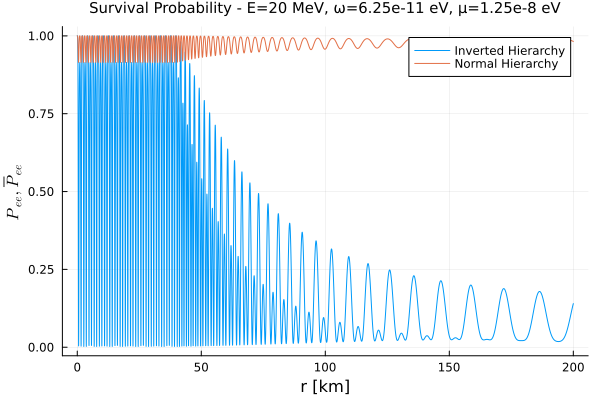

In [307]:
r=LinRange(r_i,r_f,10000)
P_IH=sol_IH(r*from_eV_to_1_over_km)
P_NH=sol_NH(r*from_eV_to_1_over_km)

plot(r,1/2*(1 .+P_IH[3,:]/P_IH[1][3]),label="Inverted Hierarchy")
plot!(r,1/2*(1 .+P_NH[3,:]/P_NH[1][3]),label="Normal Hierarchy")
title!("Survival Probability - E=$E MeV, ω=$omega eV, μ=$mu_0 eV",titlefontsize=10) 
xlabel!("r [km]")
ylabel!(L"P_{ee}, \overline{P}_{ee}")

## 1.3. Asymmetric and $\mu=(r)$

In [311]:
P=[0,0,1,0,0,0.8]
E=20 #MeV
r_i,r_f=0,200 #km

omega=delta_m2_31/(2*E*10^6)
omega_max=delta_m2_31/(2*10^6)
mu_opt,mu_0 ="SN", 10*omega_max

sol_IH= @btime solver_Isotropic_Monoenergetic(P,E,r_i,r_f,"IH",mu_opt,mu_0,reltol=1e-11,abstol=1e-11)
sol_NH= @btime solver_Isotropic_Monoenergetic(P,E,r_i,r_f,"NH",mu_opt,mu_0);

  69.368 ms (1356738 allocations: 64.43 MiB)
  44.494 ms (859763 allocations: 41.50 MiB)


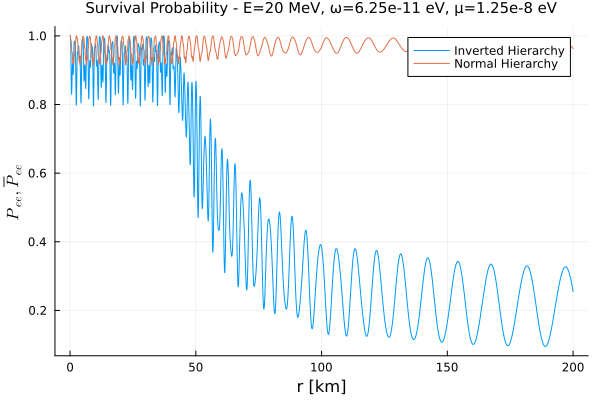

In [312]:
r=LinRange(r_i,r_f,10000)
P_IH=sol_IH(r*from_eV_to_1_over_km)
P_NH=sol_NH(r*from_eV_to_1_over_km)

plot(r,1/2*(1 .+P_IH[3,:]/P_IH[1][3]),label="Inverted Hierarchy")
plot!(r,1/2*(1 .+P_NH[3,:]/P_NH[1][3]),label="Normal Hierarchy")
title!("Survival Probability - E=$E MeV, ω=$omega eV, μ=$mu_0 eV",titlefontsize=10) 
xlabel!("r [km]")
ylabel!(L"P_{ee}, \overline{P}_{ee}")

# 2. Istropic Neutrino Gas with Spectral Distribution 

In [4]:
function initiate(nu_types,r_i,r_f,E_i,E_f,E_step,E_0,Amplitude)
    y0=Float64[]#Initial state
    omega=Float64[]
    flavor_sign=1

    E_vec=range(E_i,E_f,step=E_step)
    n_E=length(E_vec)

    n_f=length(nu_types)
    n_dim=(n_f^2)-1
    
    for i in 1:n_E 
        push!(omega,delta_m2_31/(2*E_vec[i]*10^6)) #eV        
        for j in 1:n_f
            if nu_types[j]=="nu_x"
              flavor_sign=-1
            end
            if nu_types[j]=="nu_e"
              flavor_sign=1
            end
        #nu
        index=(n_f*(j-1))+1
        nu_spec=Amplitude[index]*phi(E_vec[i],E_0[index],2.3)*E_step
        push!(y0,0.0)
        push!(y0,0.0)
        push!(y0,flavor_sign*nu_spec)
        #nubar
        nu_spec=Amplitude[index+1]*phi(E_vec[i],E_0[index+1],2.3)*E_step
        push!(y0,0.0)
        push!(y0,0.0)
        push!(y0,flavor_sign*nu_spec)
        end
    end

    #mu
    mu_0=(10)*maximum(omega)
    #r array
    r_step = (2*pi/maximum(omega))/20 #eV⁻¹
    r_i = r_i*from_eV_to_1_over_km #eV⁻¹
    r_f = r_f*from_eV_to_1_over_km #eV⁻¹
    r = range(r_i,r_f,step=r_step) #eV⁻¹

    return y0,omega,E_vec,r,mu_0,n_f,n_dim,n_E

end;

function func_Collective_nu!(dy,y, params, time)
    omega,mu_opt,mu_0,n_f,n_dim,n_E= params  # unpack parameters
    
    B=B_vec(n_dim,theta_31)
    L=L_vec(n_dim)
    
    r=time/from_eV_to_1_over_km #From eV⁻¹ to km
    mu=mu_supernova(r,mu_opt,mu_0)
    lamb=lambda_supernova(r,"no",0) 
    
    nu, nubar = [],[]
    num_diff_nu_compnents=2*n_f*n_dim
    #Filling [Energy bin][Nu_types][3components]
    for i in 1:n_E
        push!(nu,[])
        push!(nubar,[])
        for j in 1:n_f
            push!(nu[i],[])
            push!(nubar[i],[])
            for k in 1:n_dim
                #nu 
                nu_index=((i-1)*num_diff_nu_compnents)+k+2*(j-1)*n_dim
                push!(nu[i][j],y[nu_index])
                #nubar   
                nubar_index=((i-1)*num_diff_nu_compnents)+(k+n_dim)+2*(j-1)*n_dim
                push!(nubar[i][j],y[nubar_index])
            end
        end
    end
    
    #Summed nu and nubar components
    nu_sum=sum(sum(nu))
    nubar_sum=sum(sum(nubar))

    # list of dy/dt=f functions
    for i in 1:n_E
        for j in 1:n_f
            #nu 
            P_aux= cross_prod(nu[i][j],(B*omega[i]+L*lamb-mu*((nu_sum-nu[i][j])-nubar_sum)))
            for k in 1:n_dim
              nu_index=((i-1)*num_diff_nu_compnents)+k+2*(j-1)*n_dim
              dy[nu_index]=P_aux[k]
            end
            #nubar
            P_aux= cross_prod(nubar[i][j],(-1*B*omega[i]+L*lamb-mu*(nu_sum-(nubar_sum-nubar[i][j]))))
            for k in 1:n_dim
              nubar_index=((i-1)*num_diff_nu_compnents)+(k+n_dim)+2*(j-1)*n_dim
              dy[nubar_index]=P_aux[k]
            end
        end
    end
    
end;


function solver_two_families(nu_types,r_i,r_f,E_i,E_f,E_step,E_0,Amplitude,mass_ord;reltol=1e-8,abstol=1e-8)

    y0,omega,E_vec,r,mu_0,n_f,n_dim,n_E=initiate(nu_types,r_i,r_f,E_i,E_f,E_step,E_0,Amplitude)
    
    if mass_ord=="NH"
        params=omega,"SN",mu_0,n_f,n_dim,n_E
    elseif mass_ord=="IH"
        params=-1*omega,"SN",mu_0,n_f,n_dim,n_E
    else
        print("Not a mass ordering option!")
        return 0
    end
    
    r_i=r_i*from_eV_to_1_over_km
    r_f=r_f*from_eV_to_1_over_km
    
#     func_Collective_nu!(y0,y0,params,1)
    prob = ODEProblem(func_Collective_nu!,y0,(r_i,r_f),params,reltol=reltol,abstol=abstol)
    sol = solve(prob)
    
    return sol,n_f,n_dim,n_E,E_vec,sol.t/from_eV_to_1_over_km

end;

In [5]:
nu_types=["nu_e","nu_x"]
r_i,r_f=0,200 #km
E_i,E_f=1,50
E_step=0.5

#Initial spectrum
E_0=[10,15,24,24] #Mean energy in MeV
Amplitude=[1,1*10/15,1*10/24,1*10/24];

In [6]:
# y0,omega,E_vec,r,mu_0,n_f,n_dim,n_E=initiate(nu_types,r_i,r_f,E_i,E_f,E_step,E_0,Amplitude)
sol,n_f,n_dim,n_E,E_vec,r_km=@btime solver_two_families(nu_types,r_i,r_f,E_i,E_f,E_step,E_0,Amplitude,"IH";reltol=1e-7,abstol=1e-7);

  29.924 s (766418612 allocations: 19.18 GiB)


In [7]:
function from_1D_to_MultiD_Energy(sol,n_f,n_dim,n_E)
    nu, nubar = [],[]
    num_diff_nu_compnents=2*n_f*n_dim
    #Filling [Energy bin][Nu_types][3components]
    for i in 1:n_E
        push!(nu,[])
        push!(nubar,[])
        for j in 1:n_f
            push!(nu[i],[])
            push!(nubar[i],[])
            for k in 1:n_dim
                #nu 
                nu_index=((i-1)*num_diff_nu_compnents)+k+2*(j-1)*n_dim
                push!(nu[i][j],sol[nu_index,:])
                #nubar   
                nubar_index=((i-1)*num_diff_nu_compnents)+(k+n_dim)+2*(j-1)*n_dim
                push!(nubar[i][j],sol[nubar_index,:])
            end
        end
    end
    return nu, nubar
end;


In [8]:
P_nu,P_nubar= from_1D_to_MultiD_Energy(sol,n_f,n_dim,n_E);

In [9]:
function from_P_vector_to_Spectrum(nu, nubar)
  nu_e_time,nubar_e_time=[],[]
  nu_x_time,nubar_x_time=[],[]

  for l in 1:length(nu[1][1][1]) #time array length
      push!(nu_e_time,[])
      push!(nubar_e_time,[])
      push!(nu_x_time,[])
      push!(nubar_x_time,[])
    
      for i in 1:length(nu) #Energy array length
        #nu
        Pee=(1/2)*(1+nu[i][1][3][l]/nu[i][1][3][1])
        Pxx=(1/2)*(1+nu[i][2][3][l]/nu[i][2][3][1])
            
        push!(nu_e_time[l],Pee*nu[i][1][3][1]+(1-Pxx)*(-1)*nu[i][2][3][1])
        push!(nu_x_time[l],Pxx*(-1)*nu[i][2][3][1]+(1-Pee)*nu[i][1][3][1])

        #nubar
        Pee=(1/2)*(1+nubar[i][1][3][l]/nubar[i][1][3][1])
        Pxx=(1/2)*(1+nubar[i][2][3][l]/nubar[i][2][3][1])

        push!(nubar_e_time[l],Pee*nubar[i][1][3][1]+(1-Pxx)*(-1)*nubar[i][2][3][1])
        push!(nubar_x_time[l],Pxx*(-1)*nubar[i][2][3][1]+(1-Pee)*nubar[i][1][3][1])
    end
  end
  return   nu_e_time,nubar_e_time, nu_x_time,nubar_x_time
end;

In [10]:
nu_e_time,nubar_e_time, nu_x_time,nubar_x_time=from_P_vector_to_Spectrum(P_nu, P_nubar);

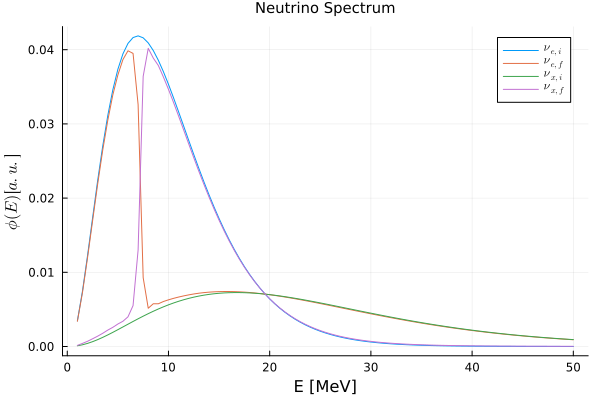

In [11]:
plot(E_vec,nu_e_time[1],label=L"$\nu_{e,i}$")
plot!(E_vec,nu_e_time[length(nu_e_time)],label=L"$\nu_{e,f}$")
plot!(E_vec,nu_x_time[1],label=L"$\nu_{x,i}$")
plot!(E_vec,nu_x_time[length(nu_x_time)],label=L"$\nu_{x,f}$")
title!("Neutrino Spectrum",titlefontsize=10) 
xlabel!("E [MeV]")
ylabel!(L"\phi (E) [a.u.]")

┌ Info: Saved animation to /Users/gefan/Downloads/SN/Neutrino-Collective-Effects/Developing/anim_fps15.gif
└ @ Plots /Users/gefan/.julia/packages/Plots/gzYVM/src/animation.jl:149


Plots.AnimatedGif("/Users/gefan/Downloads/SN/Neutrino-Collective-Effects/Developing/anim_fps15.gif")
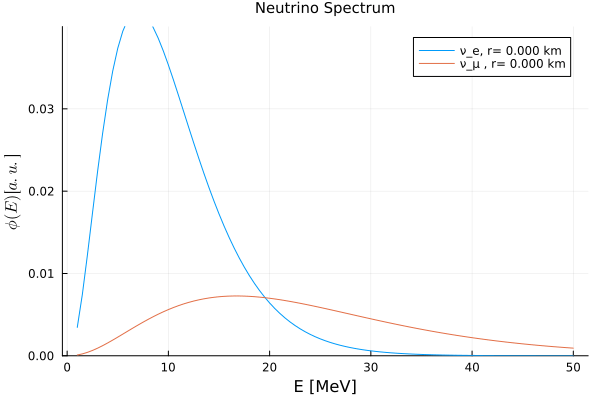

In [13]:
anim = @animate for i in 1:length(nu_e_time)
    plot(E_vec,nu_e_time[i],label=@sprintf("ν_e, r= %.3f km",r_km[i]))
    plot!(E_vec,nu_x_time[i],label=@sprintf("ν_μ , r= %.3f km",r_km[i]))
    title!("Neutrino Spectrum",titlefontsize=10) 
    xlabel!("E [MeV]")
    ylabel!(L"\phi (E) [a.u.]")
    ylims!((0,0.04))
end
gif(anim, "anim_fps15.gif", fps = 50)

┌ Info: Saved animation to /Users/gefan/Downloads/SN/Neutrino-Collective-Effects/Developing/anim_fps15.gif
└ @ Plots /Users/gefan/.julia/packages/Plots/gzYVM/src/animation.jl:149


Plots.AnimatedGif("/Users/gefan/Downloads/SN/Neutrino-Collective-Effects/Developing/anim_fps15.gif")
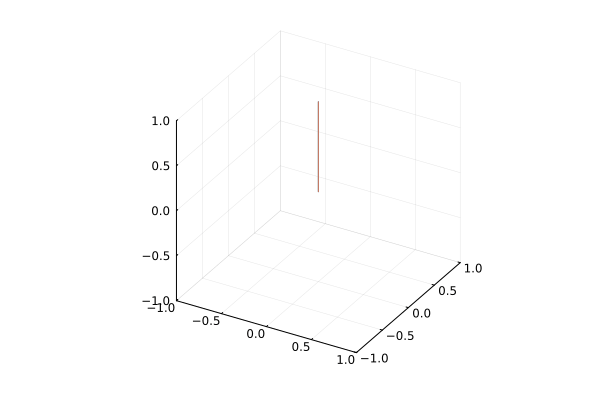

In [298]:
flavor_i=1
anim = @animate for t_i in 1:length(nu_e_time)
# anim = @animate for t_i in 1:100
    E_i=10
    P_vec=[P_nu[E_i][flavor_i][1][t_i],P_nu[E_i][flavor_i][2][t_i],P_nu[E_i][flavor_i][3][t_i]]
    P_vec=P_vec/sqrt(P_vec'P_vec)
    quiver([0],[0],[0], quiver = ([P_vec[1]], [P_vec[2]], [P_vec[3]]))
    
    E_i=50
    P_vec=[P_nu[E_i][flavor_i][1][t_i],P_nu[E_i][flavor_i][2][t_i],P_nu[E_i][flavor_i][3][t_i]]
    P_vec=P_vec/sqrt(P_vec'P_vec)
    quiver!([0],[0],[0], quiver = ([P_vec[1]], [P_vec[2]], [P_vec[3]]))
    xlims!(-1,1)
    ylims!(-1,1)
    zlims!(-1,1)
end
gif(anim, "anim_fps15.gif", fps = 30)

## Julia Tutorials

In [1]:
f(u,p,t) = 1.01*u
u0 = 1/2
tspan = (0.0,1.0)
prob = ODEProblem(f,u0,tspan)
sol = solve(prob, Tsit5(), reltol=1e-8, abstol=1e-8);

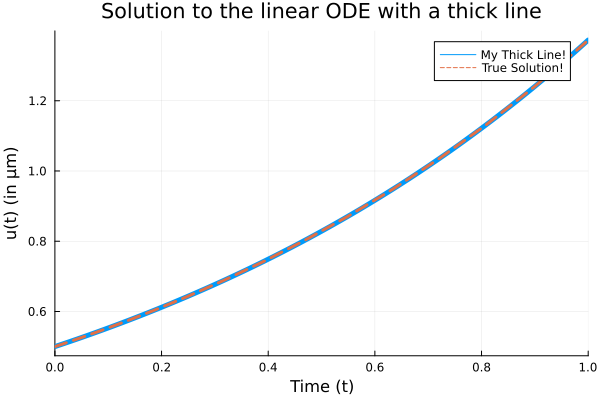

In [2]:
using Plots
plot(sol,linewidth=5,title="Solution to the linear ODE with a thick line",
     xaxis="Time (t)",yaxis="u(t) (in μm)",label="My Thick Line!") # legend=false
plot!(sol.t, t->0.5*exp(1.01t),lw=3,ls=:dash,label="True Solution!")

In [3]:
function lorenz!(du,u,p,t)
 du[1] = 10.0*(u[2]-u[1])
 du[2] = u[1]*(28.0-u[3]) - u[2]
 du[3] = u[1]*u[2] - (8/3)*u[3]
end

lorenz! (generic function with 1 method)

In [25]:
u0 = [1.0;0.0;0.0]
tspan = (0.0,100.0)
prob = ODEProblem(lorenz!,u0,tspan)
sol = @btime solve(prob)

  611.542 μs (11477 allocations: 1023.06 KiB)


retcode: Success
Interpolation: specialized 4th order "free" interpolation, specialized 2nd order "free" stiffness-aware interpolation
t: 1263-element Vector{Float64}:
   0.0
   3.5678604836301404e-5
   0.0003924646531993154
   0.0032624077544510573
   0.009058075635317072
   0.01695646895607931
   0.02768995855685593
   0.04185635042021763
   0.06024041165841079
   0.08368541255159562
   0.11336499649094857
   0.1486218182609657
   0.18703978481550704
   ⋮
  99.05535949898116
  99.14118781914485
  99.22588252940076
  99.30760258626904
  99.39665422328268
  99.49536147459878
  99.58822928767293
  99.68983993598462
  99.77864535713971
  99.85744078539504
  99.93773320913628
 100.0
u: 1263-element Vector{Vector{Float64}}:
 [1.0, 0.0, 0.0]
 [0.9996434557625105, 0.0009988049817849058, 1.781434788799208e-8]
 [0.9961045497425811, 0.010965399721242457, 2.146955365838907e-6]
 [0.9693591634199452, 0.08977060667778931, 0.0001438018342266937]
 [0.9242043615038835, 0.24228912482984957, 0.001046162

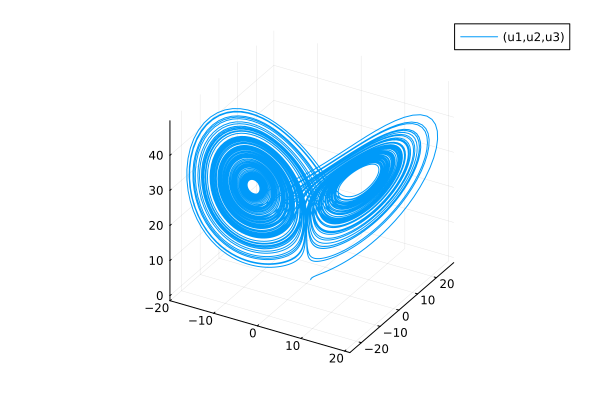

In [26]:
plot(sol,vars=(1,2,3))